# NYC 311 Dataset Analysis
Aditi Krishnakumar

## Overview

Dataset: https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9

311 is a service that New York City residents can use to make non-emergency reports to the city for things like noise complaints, graffiti, potholes, etc. Each complaint that comes into the city is registered, along with additional information like the location, the neighborhood, the agency that responded to the request, etc.

__Challenge One:__
1. 	Number of incidents opened per year
	- __2010:__	  2031813
	- __2011:__	  1961598
	- __2012:__	  1796170
	- __2013:__	  1839972
	- __2014:__	  2113991
	- __2015:__	  2300743
	- __2016:__	  2391352
	- __2017:__	  2492069
	- __2018:__	  2748296
	- __2019:__	  2395171
	- __2020:__	  2593407
	- __2021:__	  2631521
    
    
2. Brooklyn has the most number of incidents (8054112)

__Challenge Two:__
- Constructed a Random Forest Classifier to predict the type of a given complaint. An accuracy of around 69% was achieved. Agency was one of the most important features used to determine complaint type.
    * __Benefits__: Predicting the type of a complaint will be especially useful having determined that agency and location help determine the complaint type. This will allow NYC 311 to allocate appropriate resources/agencies to appropriate locations in order to handle complaints more efficiently. The abiltity to predict the complaint type will also be increase the speed at which action is taken.
    
    
    
- Further exploration of the data with interactive visualizations and statistical analyses are also added
- Findings:
    - Complaint Types
        * Tree related complaints take the longest to close and have the highest number of unresolved incidents. All 'Tree' complaints come from the 'Unspecified' Borough
        * Benefit Card Replacement,Vending, Animal Abuse complaints on average are resolved within the same day
        * The top 30 complaints seem to be residentially related (hot water, blocked driveway, plumbing, item collection, etc)
        * An Analysis of Variance (ANOVA) test allowed the rejection of the null hypothesis that there is no significant difference between mean days till closure per complaint type.
    - Boroughs
        * Complaints from Queens take the longest on average to resolve
        * On average, complaints take 14.63 days to close
        * 'Consumer Complaint' types are one of the top 4 complaint types that take the longest to resolve amongst all the specified boroughs
        * An Analysis of Variance (ANOVA) test allowed the rejection of the null hypothesis that there is no significant difference between average duration till resolution per Borough
    - Time
        * Average days taken to resolve incidents decreased over time (years) while number of incidents increase over time (years). This could indicate improvements in efficiency, allocation of resources, agencies, etc to resolve incidents over time
        * There is a strong, negative correlation between the year that the incident was reported and the length of time in days it takes on average to close the incident

311 will be able to use these findings to allocate resources to boroughs and agencies (dealing with specific complaint types) as needed to increase efficiency. These findings could also be provided to the public to let them know approximately how long it would take to resolve their complaints.

### Importing Libraries and database

In [1]:
import pandas as pd
import psycopg2
import pickle
from dask import dataframe as dd
import datetime as dt
import random
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns
import datashader as ds
import colorcet as cc
import plotly.express as px
import IPython
import plotly

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import RandomizedSearchCV
from statsmodels.formula.api import ols
import statsmodels.api as sm
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix, classification_report

plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['font.size'] = '15'
%config InlineBackend.figure_format ='retina'

In [2]:
def query_db(query):
    '''
    Runs sql query on 311 database and returns a pandas DataFrame.
    Redshift is a data warehouse based on PostgreSQL, so syntax is mostly the same
    '''
    host = 'interview-ds.ckgnwnm6pw4o.us-east-1.redshift.amazonaws.com'
    port = 5439
    db = 'interview'
    username = 'dsguest'
    password = 'nX9EFYUZ5Yu#0q'
    conn = psycopg2.connect(host=host, port=port, dbname=db, user=username, password=password)
    cur = conn.cursor()
    cur.execute(query)
    rows = cur.fetchall()
    rows = pd.DataFrame(rows)
    return rows

In [126]:
# download dataset as parquet file
df_311 = dd.read_parquet('311_parq.parquet', engine='pyarrow')

In [86]:
df_311.head()

,UniqueKey,CreatedDate,ClosedDate,Agency,AgencyName,ComplaintType,Descriptor,LocationType,IncidentZip,IncidentAddress,...,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location
0,45750828,03/05/2020 12:41:23 AM,03/05/2020 03:05:17 AM,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Talking,Street/Sidewalk,10031,605 WEST 141 STREET,...,None,None,None,None,None,None,None,40.824082,-73.952747,"(40.82408197350836, -73.95274687000166)"
1,46838871,07/12/2020 07:59:00 AM,07/15/2020 12:00:00 PM,DSNY,BCC - Brooklyn South,Missed Collection (All Materials),1R Missed Recycling-All Materials,Sidewalk,11235,2806 BRIGHAM STREET,...,None,None,None,None,None,None,None,40.585140,-73.932229,"(40.585140074477685, -73.93222890069059)"
2,46838872,07/12/2020 10:47:00 AM,07/15/2020 12:00:00 PM,DSNY,BCC - Brooklyn South,Missed Collection (All Materials),1R Missed Recycling-All Materials,Sidewalk,11235,2655 BATCHELDER STREET,...,None,None,None,None,None,None,None,40.588563,-73.936726,"(40.58856266174886, -73.93672597082174)"
3,46838873,07/12/2020 12:17:00 PM,07/13/2020 12:00:00 PM,DSNY,BCC - Brooklyn South,Missed Collection (All Materials),1R Missed Recycling-All Materials,Sidewalk,11218,388 EAST 7 STREET,...,None,None,None,None,None,None,None,40.642295,-73.972514,"(40.64229514276287, -73.9725137744766)"
4,46838874,07/12/2020 09:04:00 AM,07/15/2020 12:00:00 PM,DSNY,BCC - Brooklyn South,Missed Collection (All Materials),1R Missed Recycling-All Materials,Sidewalk,11235,2812 BRIGHAM STREET,...,None,None,None,None,None,None,None,40.585066,-73.932218,"(40.58506595849389, -73.9322181751635)"


In [188]:
# number of rows
print('Number of rows: ', end=" ")
len(df_311['UniqueKey'])

Number of rows:  

27296103

## Exploratory Data Analysis

### Null values per column

In [95]:
for col in df_311:
    print(col)
    print(df_311[col].isnull().sum().compute())

UniqueKey
0
CreatedDate
0
ClosedDate
758809
Agency
0
AgencyName
0
ComplaintType
0
Descriptor
434151
LocationType
6436400
IncidentZip
1426741
IncidentAddress
4445917
StreetName
4447516
CrossStreet_1
8520666
CrossStreet_2
8639694
IntersectionStreet_1
19792480
IntersectionStreet_2
19798474
AddressType
4254569
City
1700872
Landmark
23566930
FacilityType
21779348
Status
0
DueDate
18626526
ResolutionDescription
547614
ResolutionDate
397190
CommunityBoard
45118
BBL
6330784
Borough
45118
X_Coordinate
2162400
Y_Coordinate
2162068
Open Data Channel Type
0
Park Facility Name
1564
Park Borough
45118
Vehicle Type
27286519
Taxi Company Borough
27274133
Taxi Pick Up Location
27086406
Bridge Highway Name
27216240
Bridge Highway Direction
27227541
Road Ramp
27233685
Bridge Highway Segment
27213103
Latitude
2162415
Longitude
2162415
Location
2162415


__<u>Observations:</u>__
- ComplaintType has no null values (needed for Challenge two)
- Column with most null values is Vehicle Type = 27286519 = 99.96%
- Related columns to vehicle type (e.g. Taxi Company Borough, Road Ramp etc.) also have high amount of null

### Parse dates as datetime objects

In [131]:
# convert columns to datetime objects
df_311['CreatedDate'] = dd.to_datetime(df_311['CreatedDate'], format = '%m/%d/%Y %I:%M:%S %p', errors='coerce')
df_311['ClosedDate'] = dd.to_datetime(df_311['ClosedDate'], format = '%m/%d/%Y %I:%M:%S %p',errors='coerce' )
df_311['DueDate'] = dd.to_datetime(df_311['DueDate'], format = '%m/%d/%Y %I:%M:%S %p', errors='coerce')
df_311['ResolutionDate'] = dd.to_datetime(df_311['ResolutionDate'], format = '%m/%d/%Y %I:%M:%S %p', errors='coerce')

In [137]:
# extract year of each incident creation
df_311['CreatedYear'] = df_311['CreatedDate'].dt.year 

In [184]:
df_311.head()

,UniqueKey,CreatedDate,ClosedDate,Agency,AgencyName,ComplaintType,Descriptor,LocationType,IncidentZip,IncidentAddress,...,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Latitude,Longitude,Location,CreatedYear
0,45750828,2020-03-05 00:41:23,2020-03-05 03:05:17,NYPD,New York City Police Department,Noise - Street/Sidewalk,Loud Talking,Street/Sidewalk,10031,605 WEST 141 STREET,...,None,None,None,None,None,None,40.824082,-73.952747,"(40.82408197350836, -73.95274687000166)",2020
1,46838871,2020-07-12 07:59:00,2020-07-15 12:00:00,DSNY,BCC - Brooklyn South,Missed Collection (All Materials),1R Missed Recycling-All Materials,Sidewalk,11235,2806 BRIGHAM STREET,...,None,None,None,None,None,None,40.585140,-73.932229,"(40.585140074477685, -73.93222890069059)",2020


### Group by year to get number of incidents opened per year

In [166]:
open_year = df_311.groupby('CreatedYear').UniqueKey.count().compute()

In [173]:
open_year = open_year.reset_index()

In [185]:
# dataframe with incidents opened per year
open_year

,CreatedYear,UniqueKey
0,2010,2031813
1,2011,1961598
2,2012,1796170
3,2013,1839972
4,2014,2113991
5,2015,2300743
6,2016,2391352
7,2017,2492069
8,2018,2748296
9,2019,2395171


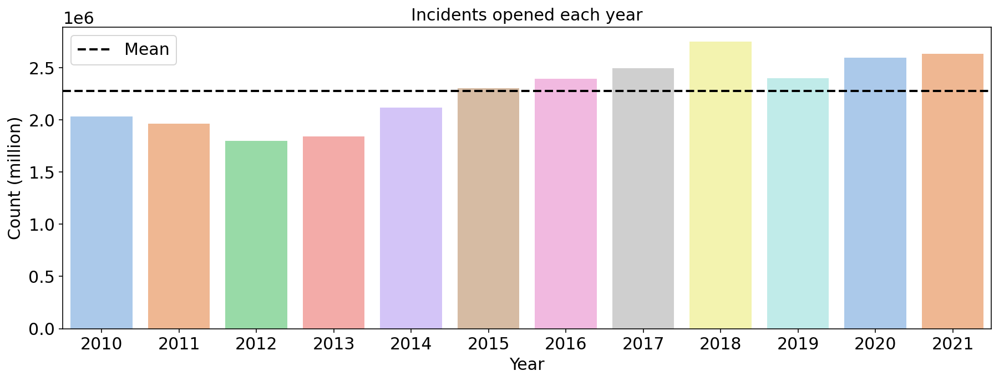

In [183]:
# graph of number of incidents opened per year
sns.barplot(x = 'CreatedYear', y = 'UniqueKey', data = open_year, palette = 'pastel')
plt.ylabel('Count (million)')
plt.xlabel('Year')
plt.title('Incidents opened each year', fontsize = 15)
plt.axhline(open_year['UniqueKey'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best')

__<u>Observations:</u>__
- 2018 has the highest number of incidents opened (2748296)
- 2012 has the least (1796170)

### Distribution of boroughs

In [186]:
# group by boroughs
boroughs = df_311.groupby('Borough').UniqueKey.count().compute()

In [190]:
boroughs = boroughs.reset_index()

In [1028]:
boroughs

,Borough,UniqueKey
0,BRONX,5006994
1,BROOKLYN,8054112
2,MANHATTAN,5367309
3,QUEENS,6252391
4,STATEN ISLAND,1337933
5,Unspecified,1232246


DataFrame with count of incidents per Borough

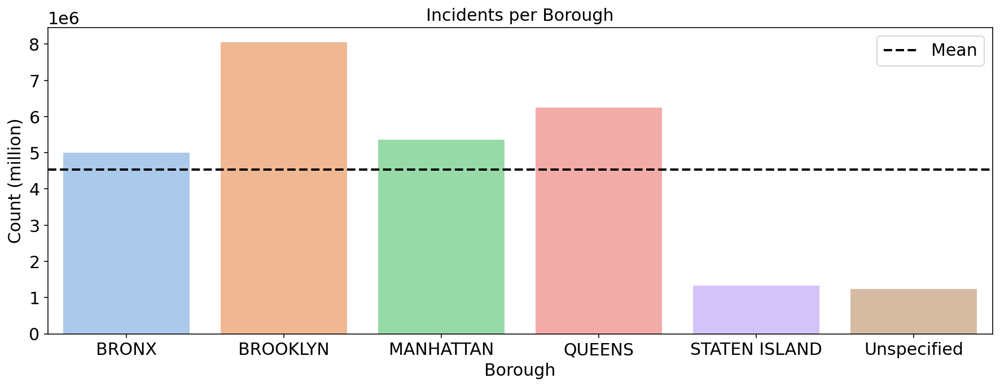

In [192]:
# distribution of boroughs
sns.barplot(x = 'Borough', y = 'UniqueKey', data = boroughs, palette = 'pastel')
plt.ylabel('Count (million)')
plt.xlabel('Borough')
plt.title('Incidents per Borough', fontsize = 15)
plt.axhline(boroughs['UniqueKey'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best')

__<u>Observations:</u>__
- Brooklyn has the highest number of incidents (8054112)
- Staten Island has the least out of the named boroughs (1337933) and 'Unspecified' has the least overall (1232246)

# Challenge one

1. 	Number of incidents opened per year
	- __2010:__	  2031813
	- __2011:__	  1961598
	- __2012:__	  1796170
	- __2013:__	  1839972
	- __2014:__	  2113991
	- __2015:__	  2300743
	- __2016:__	  2391352
	- __2017:__	  2492069
	- __2018:__	  2748296
	- __2019:__	  2395171
	- __2020:__	  2593407
	- __2021:__	  2631521

2. Brooklyn has the most number of incidents (8054112)

### Complaint types

In [193]:
# group by complaint types
complaints = df_311.groupby('ComplaintType').UniqueKey.count().compute()

In [196]:
complaints = complaints.reset_index()

In [878]:
complaints.sort_values('Count',ascending=False)

,ComplaintType,Count
0,Noise - Residential,2566113
1,HEAT/HOT WATER,1576493
2,Illegal Parking,1412240
3,Blocked Driveway,1182370
4,Street Condition,1088157
...,...,...
385,Misc. Comments%}dt2pq'/&quo...,1
384,Misc. Comments&amp;echo xjd...,1
383,Misc. Comments&amp;nslookup...,1
382,Misc. Comments&amp;ping -n ...,1


__<u>Note:</u> 474 different complaint types__

In [200]:
complaints['UniqueKey'].mean()

57586.715189873416

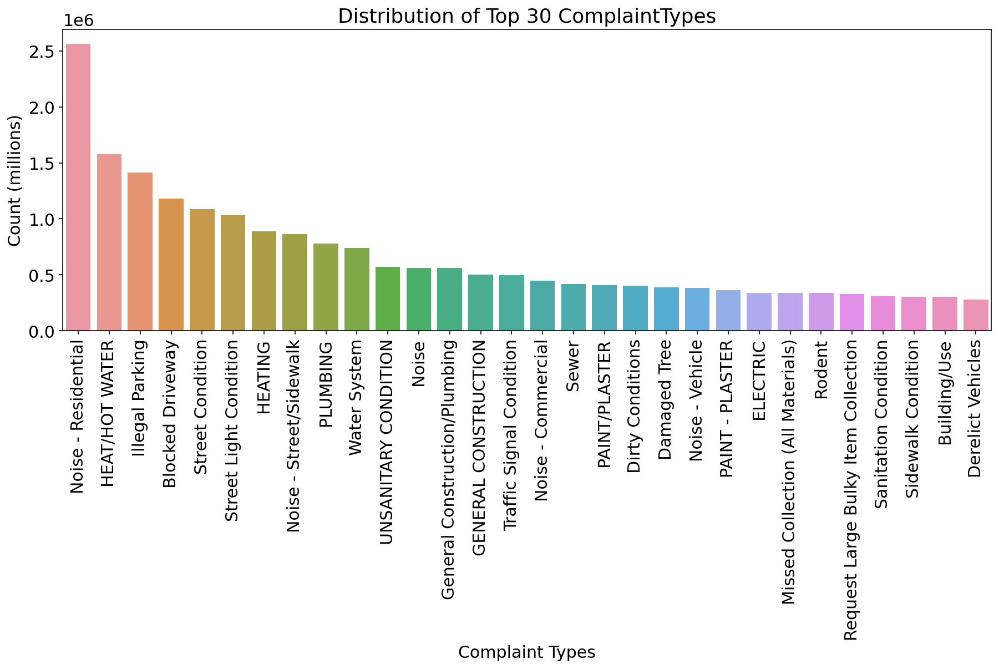

In [879]:
# graph the distribution of top 30 complaint types
sns.barplot(x='ComplaintType',y='Count',data=complaints.sort_values('Count',ascending=False)[:30])
plt.title('Distribution of Top 30 ComplaintTypes')
plt.xlabel('Complaint Types')
plt.ylabel('Count (millions)')
plt.xticks(rotation=90)
plt.show()

__<u>Observations:</u>__
- Noise - Residential has much higher amounts of incidents
- Other complaints in top 30 also seem to be residential related complaints (hot water, blocked driveway, plumbing, item collection, etc)

# Challenge two

## Data Preprocessing

### Taking a subset of the data

Since the dataset is quite large, we can take a subset of the dataset to make operations more efficient

In [244]:
num_rows = 27296103 # from above
num_samples = round(0.05 * num_rows) # 5% of dataset
print(num_samples)

1364805


In [247]:
# taking a random sample of the dataset
sampled_df = df_311.sample(frac=0.05,random_state=1).compute()

### Preprocessing target variable 'ComplaintType'

In [306]:
# create complaints df again
def group_complaints(df):
    """ create complaints df to group by complaints """
    
    complaints_samp = df.groupby('ComplaintType').UniqueKey.count()
    complaints_samp = complaints_samp.reset_index()
    
    # renaming count column and sort descending based on count
    complaints_samp.rename(columns={'UniqueKey': 'Count'},inplace=True)
    complaints_samp.sort_values('Count',ascending=False,inplace=True,ignore_index=True)
    
    return complaints_samp

In [307]:
# create df grouped by complaints
complaints_samp = group_complaints(sampled_df)

In [308]:
# look at all values of complaint type
complaints_samp['ComplaintType'].tolist()

['Noise - Residential',
 'HEAT/HOT WATER',
 'Illegal Parking',
 'Blocked Driveway',
 'Street Condition',
 'Street Light Condition',
 'HEATING',
 'Noise - Street/Sidewalk',
 'PLUMBING',
 'Water System',
 'UNSANITARY CONDITION',
 'Noise',
 'General Construction/Plumbing',
 'GENERAL CONSTRUCTION',
 'Traffic Signal Condition',
 'Noise - Commercial',
 'Sewer',
 'Dirty Conditions',
 'PAINT/PLASTER',
 'Damaged Tree',
 'Noise - Vehicle',
 'PAINT - PLASTER',
 'Missed Collection (All Materials)',
 'ELECTRIC',
 'Rodent',
 'Request Large Bulky Item Collection',
 'Sanitation Condition',
 'Sidewalk Condition',
 'Building/Use',
 'Derelict Vehicles',
 'NONCONST',
 'DOOR/WINDOW',
 'WATER LEAK',
 'Consumer Complaint',
 'Derelict Vehicle',
 'Graffiti',
 'GENERAL',
 'New Tree Request',
 'Homeless Person Assistance',
 'Overgrown Tree/Branches',
 'Taxi Complaint',
 'Broken Muni Meter',
 'Non-Emergency Police Matter',
 'FLOORING/STAIRS',
 'Maintenance or Facility',
 'APPLIANCE',
 'Elevator',
 'Benefit Card R

__<u>Observations: </u>__
- Many of the complaint types are not legible (e.g. %2e%2e%5c%2e%2e%5c%2e%2e%5c...). Can delete these rows

In [309]:
# complaint types to remove
comp_remove = ['NONCONST','ZTESTINT',
 '...\\.\\...\\.\\...\\.\\...\\.\\......','Misc. Comments&amp;nslookup...',
 "Misc. Comments'",
 'No Child Left Behind',
 'Public Assembly',
 "eval(compile('for x in rang..."]

In [310]:
# delete rows with illegible Complaint Types
sampled_df = sampled_df[sampled_df['ComplaintType'].isin(comp_remove) == False] 

### Reducing the number of classes

There are over 300 classes of the target variable Complaint Types, we can condense this down by grouping similar complaints (like 'Damaged Tree' and 'Dead/Dying Tree') as well as by creating the class 'other' made up of the complaint types that constitute < 5% of data.

In [311]:
complaint_samp = group_complaints(sampled_df)
complaint_samp

,ComplaintType,Count
0,Noise - Residential,128742
1,HEAT/HOT WATER,78857
2,Illegal Parking,70447
3,Blocked Driveway,59074
4,Street Condition,54570
...,...,...
306,Advocate-Prop Class Incorrect,1
307,DEP Highway Condition,1
308,FHV Licensee Complaint,1
309,Advocate-SCRIE/DRIE,1


__Creating the class 'other':__

Creating a cumulative frequency column to get the percentile of complaint types. By retaining categories that go upto the 95th percentile, we can find the complaint types that account for <5% and cluster them as 'other'.

In [312]:
# create cumulative frequency column
complaint_samp['cumulative'] = complaint_samp['Count'].cumsum()

In [313]:
complaint_samp

,ComplaintType,Count,cumulative
0,Noise - Residential,128742,128742
1,HEAT/HOT WATER,78857,207599
2,Illegal Parking,70447,278046
3,Blocked Driveway,59074,337120
4,Street Condition,54570,391690
...,...,...,...
306,Advocate-Prop Class Incorrect,1,1351608
307,DEP Highway Condition,1,1351609
308,FHV Licensee Complaint,1,1351610
309,Advocate-SCRIE/DRIE,1,1351611


In [314]:
# 95% percentile 
percentile_95 = 0.95*1351612 
print(percentile_95)

1284031.4


In [315]:
# complaint types to be cast as other
other = complaint_samp[complaint_samp['cumulative'] > percentile_95]['ComplaintType'].tolist()
len(other)

226

In [316]:
# creating category 'other'
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(other,'other')

In [317]:
print(len(sampled_df['ComplaintType'].value_counts())) # number of classes
sampled_df['ComplaintType'].value_counts()

86


Noise - Residential                        128742
HEAT/HOT WATER                              78857
Illegal Parking                             70447
other                                       67977
Blocked Driveway                            59074
                                            ...  
Noise - Helicopter                           2318
Water Conservation                           2295
Special Projects Inspection Team (SPIT)      2257
DHS Advantage - Tenant                       2066
Homeless Encampment                          1967
Name: ComplaintType, Length: 86, dtype: int64

There are now __86__ classes of the target variable. Let's see if they can be 'binned' into broader categories

__Group Complaint Types further to reduce classes__

Grouping categories of complaint types into broader categories. There is bias here due to the subjectivity of the grouping (people may see things fitting into different categories).

In [320]:
# look at all the different types of complaints
complaint_samp = group_complaints(sampled_df)
complaint_samp['ComplaintType'].tolist()

['Noise - Residential',
 'HEAT/HOT WATER',
 'Illegal Parking',
 'other',
 'Blocked Driveway',
 'Street Condition',
 'Street Light Condition',
 'HEATING',
 'Noise - Street/Sidewalk',
 'PLUMBING',
 'Water System',
 'UNSANITARY CONDITION',
 'Noise',
 'General Construction/Plumbing',
 'GENERAL CONSTRUCTION',
 'Traffic Signal Condition',
 'Noise - Commercial',
 'Sewer',
 'Dirty Conditions',
 'PAINT/PLASTER',
 'Damaged Tree',
 'Noise - Vehicle',
 'PAINT - PLASTER',
 'Missed Collection (All Materials)',
 'ELECTRIC',
 'Rodent',
 'Request Large Bulky Item Collection',
 'Sanitation Condition',
 'Sidewalk Condition',
 'Building/Use',
 'Derelict Vehicles',
 'DOOR/WINDOW',
 'WATER LEAK',
 'Consumer Complaint',
 'Derelict Vehicle',
 'Graffiti',
 'GENERAL',
 'New Tree Request',
 'Homeless Person Assistance',
 'Overgrown Tree/Branches',
 'Taxi Complaint',
 'Broken Muni Meter',
 'Non-Emergency Police Matter',
 'FLOORING/STAIRS',
 'Maintenance or Facility',
 'APPLIANCE',
 'Elevator',
 'Benefit Card Repl

In [321]:
# group all 'Noise' complaints
noise = ['Noise - Residential','Noise - Street/Sidewalk','Noise','Noise - Commercial',
'Noise - Vehicle', 'Noise - Park','Noise - Helicopter']
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(noise,'Noise')

In [348]:
# cluster other complaint types
parking = ['Illegal Parking','Blocked Driveway','DOF Parking - Payment Issue',
          'Broken Parking Meter','Broken Muni Meter']
vehicle = ['Derelict Vehicles','Derelict Vehicle','Taxi Complaint','Abandoned Vehicle',
          'For Hire Vehicle Complaint','Traffic']
sanitisation = ['UNSANITARY CONDITION','Dirty Conditions','Sanitation Condition',
               'Indoor Air Quality']
tree = ['Damaged Tree','New Tree Request','Overgrown Tree/Branches','Dead/Dying Tree',
       'Dead Tree']
street = ['Street Condition','Street Light Condition','Traffic Signal Condition',
         'Sidewalk Condition','Root/Sewer/Sidewalk Condition','Snow','Street Sign - Damaged',
         'Street Sign - Missing', 'Curb Condition', 'Highway Condition','Graffiti',
          'Request Large Bulky Item Collection']
water = ['HEAT/HOT WATER','PLUMBING','Water System','Sewer','WATER LEAK','Plumbing',
        'Water Conservation']
housing = ['Rodent','Building/Use','DOOR/WINDOW','FLOORING/STAIRS','DOF Property - Reduction Issue',
          'SCRIE','Lead','DOF Property - Owner Issue','DOF Property - Request Copy','DOF Property - Payment Issue',
           'HPD Literature Request','Housing - Low Income Senior', 'DHS Advantage - Tenant','Illegal Fireworks']
homeless = ['Homeless Person Assistance','Homeless Encampment']
maintenance = ['HEATING','General Construction/Plumbing','GENERAL CONSTRUCTION',
              'PAINT/PLASTER','PAINT - PLASTER','ELECTRIC','Maintenance or Facility',
              'Elevator','APPLIANCE','Air Quality']
enforcement = ['Non-Emergency Police Matter','NonCompliance with Phased Reopening',
              'Other Enforcement','Emergency Response Team (ERT)','Special Projects Inspection Team (SPIT)']
general = ['GENERAL','Missed Collection (All Materials)']

In [353]:
# replace values in dataframe
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(parking,'Parking')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(vehicle,'Vehicle')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(sanitisation,'Sanitisation')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(tree,'Tree')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(street,'Street')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(water,'Water')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(housing,'Housing')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(homeless,'Homeless')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(maintenance,'Maintenance')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(enforcement,'Enforcement')
sampled_df['ComplaintType'] = sampled_df['ComplaintType'].replace(general,'General')

In [356]:
print(len(sampled_df['ComplaintType'].value_counts()))
sampled_df['ComplaintType'].value_counts()

19


Noise                       246289
Street                      194457
Water                       192770
Maintenance                 177750
Parking                     144944
Housing                      86192
other                        67977
Sanitisation                 66737
Vehicle                      44680
Tree                         43693
General                      26105
Enforcement                  19304
Consumer Complaint           11045
Homeless                     10964
Benefit Card Replacement      5652
Food Establishment            5020
SAFETY                        3159
Animal Abuse                  2553
Vending                       2321
Name: ComplaintType, dtype: int64

__The classes of complaint types have been brought down to 19__

Text(0.5, 1.0, 'Complaint Types')

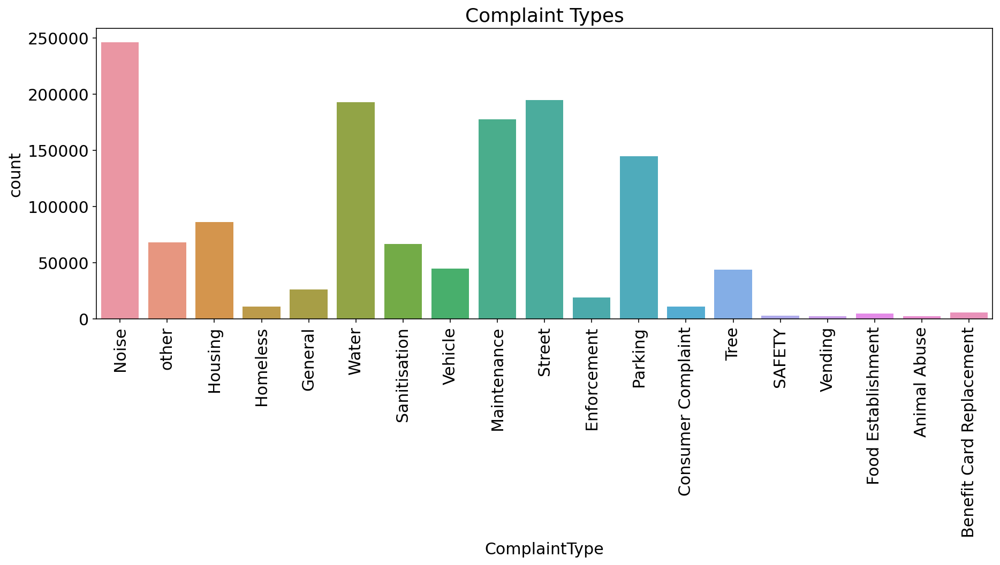

In [383]:
# distribution of complaint types
sns.countplot(sampled_df['ComplaintType'])
plt.xticks(rotation=90)
plt.title('Complaint Types')

__<u>Observation:</u>__
- Imbalanced classes. Will need to take care of this with the model

## Preprocess Remaining Features

- create column of duration in days (date SR was closed - date SR was created)
- drop column AgencyName as contains same information as Agency
- drop location as data contained within latitude, longitude features
- drop IncidentAddress, StreetName', 'CrossStreet_1',
    'CrossStreet_2', 'IntersectionStreet_1', 'IntersectionStreet_2', 'Landmark' because Incidentzip present
- drop Descriptor as focusing on broader ComplaintType
- drop City as 406 categories and incident zip already present
- drop Resolution Description, Bridge Highway Direction, Bridge Highway Name as too many categories and not as relevant to complaint type
- drop community board and bbl as borough provided
- drop X and Y coordinate as Longitute and Latitude present
- drop road ramp as information not relevant
- drop Park Facility Name as Park Borough present

In [508]:
# create duration days column and convert other date columns to datetime objects
sampled_df['CreatedDate'] = pd.to_datetime(sampled_df['CreatedDate'], format = '%Y-%m-%d %H:%M:%S')
sampled_df['ClosedDate'] = pd.to_datetime(sampled_df['ClosedDate'], format = '%Y-%m-%d %H:%M:%S')
sampled_df['ResolutionDate'] = pd.to_datetime(sampled_df['ClosedDate'], format = '%Y-%m-%d %H:%M:%S')
sampled_df['DueDate'] = pd.to_datetime(sampled_df['ClosedDate'], format = '%Y-%m-%d %H:%M:%S')
sampled_df['DurationDays'] = (sampled_df['ClosedDate'] - sampled_df['CreatedDate']).dt.days

In [505]:
# drop above mentioned columns
sampled_df.drop(['AgencyName'],axis=1,inplace=True)
sampled_df.drop(['Location'],axis=1,inplace=True)
sampled_df.drop(['IncidentAddress','Descriptor',
                 'StreetName', 'CrossStreet_1', 'CrossStreet_2', 
                'IntersectionStreet_1', 'IntersectionStreet_2'],
                axis=1,inplace=True)
sampled_df.drop(['LocationType'], axis = 1, inplace = True)
sampled_df.drop(['City','Landmark','ResolutionDescription','CommunityBoard',
                'X_Coordinate','Y_Coordinate','Bridge Highway Direction',
                'Bridge Highway Name','Bridge Highway Segment'],axis=1,inplace=True)
sampled_df.drop(['Road Ramp'], axis = 1, inplace = True)
sampled_df.drop(['BBL'], axis = 1, inplace = True)
sampled_df.drop(['Taxi Pick Up Location'], axis = 1, inplace = True)
sampled_df.drop(['Park Facility Name'],axis = 1, inplace = True)

## Handle missing values

In [510]:
# number of null values in each column
sampled_df.isnull().sum()

Unnamed: 0                      0
Unnamed: 0.1                    0
UniqueKey                       0
CreatedDate                     0
ClosedDate                  37037
Agency                          0
ComplaintType                   0
IncidentZip                 70959
AddressType                212720
FacilityType              1075843
Status                          0
DueDate                     37037
ResolutionDate              37037
Borough                      2255
Open Data Channel Type          0
Park Borough                 2255
Vehicle Type              1351116
Taxi Company Borough      1350519
Latitude                   107953
Longitude                  107953
CreatedYear                     0
DurationDays                37037
dtype: int64

__How to handle the missing values for each column:__
- ClosedData and DurationDays: leave NaN in as this represents an ongoing SR
- IncidentZip: use Mode
- AddressType: combine with 'Unrecognized' as NaN doesn't have any special meaning
- Borough: combine with 'Unspecified' as NaN doesn't have any special meaning
- Park Borough: set as 'null' to indicate incident is not a Parks Dept facility
- Vehicle Type: set as 'null' to indicate incident is not a taxi
- Taxi Company Borough: set as 'null' to indicate incident is not a taxi
- Facility Type: set 'null' as a separate category/leave as NaN depending on model
- Latitude and Longitude: fill NaN as mean

In [419]:
#sampled_df.to_csv('updated.csv')

In [511]:
# fill NaN values
sampled_df.fillna({'Park Borough':'null', 'Vehicle Type':'null',
                  'Taxi Company Borough':'null','Borough':'Unspecified',
                  'AddressType':'UNRECOGNIZED'}, inplace=True)
sampled_df.fillna({'IncidentZip':sampled_df['IncidentZip'].mode()[0]}, inplace = True)
sampled_df.fillna({'Latitude':sampled_df['Latitude'].mean(),
                   'Longitude':sampled_df['Longitude'].mean()}, inplace= True)

In [646]:
sampled_df.isnull().sum()

Unnamed: 0                    0
Unnamed: 0.1                  0
UniqueKey                     0
Agency                        0
ComplaintType                 0
IncidentZip                   0
AddressType                   0
FacilityType                  0
Status                        0
Borough                       0
Open Data Channel Type        0
Park Borough                  0
Vehicle Type                  0
Taxi Company Borough          0
Latitude                      0
Longitude                     0
CreatedYear                   0
DurationDays              37036
DayOpened                     0
MonthOpened                   0
DaysTillDue               37036
DaysTillUpdate            37036
dtype: int64

All features except the date related columns have 0 null values as desired

## Label encoding

Convert categorical variables to a usable, numerical format

In [520]:
# combine categories of status: 'Closed-Testing' and 'Closed'
sampled_df['Status'] = sampled_df['Status'].replace('Closed - Testing','Closed')

In [522]:
# categorical columns
categories = ['Agency','AddressType','FacilityType','Status',
             'Borough','Open Data Channel Type','Park Borough','Vehicle Type',
             'Taxi Company Borough']
le = LabelEncoder()

# apply label encoding
sampled_df[categories] = sampled_df[categories].apply(le.fit_transform)

In [526]:
sampled_df.head()

,Unnamed: 0,Unnamed: 0.1,UniqueKey,CreatedDate,ClosedDate,Agency,ComplaintType,IncidentZip,AddressType,FacilityType,...,ResolutionDate,Borough,Open Data Channel Type,Park Borough,Vehicle Type,Taxi Company Borough,Latitude,Longitude,CreatedYear,DurationDays
0,0,89604,46028762,2020-04-19 20:19:29,2020-04-19 22:30:54,23,Noise,10466.0,5,4,...,2020-04-19 22:30:54,0,0,0,4,5,40.891872,-73.860168,2020,0.0
1,1,77288,52143189,2021-10-11 01:14:23,2021-10-11 03:47:56,23,Noise,10011.0,0,4,...,2021-10-11 03:47:56,2,1,2,4,5,40.744225,-74.007174,2021,0.0
2,2,78106,52145700,2021-10-10 22:02:36,2021-10-10 22:22:45,15,other,10028.0,0,4,...,2021-10-10 22:22:45,2,1,2,4,5,40.773848,-73.945547,2021,0.0
3,3,87906,47081875,2020-08-03 11:59:57,2020-08-17 08:54:46,19,Housing,11213.0,0,4,...,2020-08-17 08:54:46,1,3,1,4,5,40.669156,-73.937536,2020,13.0
4,4,32171,46930356,2020-07-21 20:59:00,2020-07-22 21:00:00,5,Noise,10025.0,0,4,...,2020-07-22 21:00:00,2,3,2,4,5,40.800203,-73.960360,2020,1.0


## Handling Datetime objects

Feature engineering of datetime variables (CreatedDate, ClosedDate, ResolutionDate, DueDate) to extract information

In [528]:
# get the day of the week and month that SR was created
sampled_df['DayOpened'] = sampled_df['CreatedDate'].dt.day_of_week
sampled_df['MonthOpened'] = sampled_df['CreatedDate'].dt.month

In [538]:
# difference in days between DueDate and CreatedDate = days expected for completion
sampled_df['DaysTillDue'] = (sampled_df['DueDate'] - sampled_df['CreatedDate']).dt.days

# days from creation till last response update
sampled_df['DaysTillUpdate'] = (sampled_df['ResolutionDate'] - sampled_df['CreatedDate']).dt.days

In [540]:
# drop date columns
sampled_df.drop(['CreatedDate','ClosedDate','DueDate','ResolutionDate'],axis = 1, inplace = True)

In [545]:
sampled_df.head(2)

,Unnamed: 0,Unnamed: 0.1,UniqueKey,Agency,ComplaintType,IncidentZip,AddressType,FacilityType,Status,Borough,...,Vehicle Type,Taxi Company Borough,Latitude,Longitude,CreatedYear,DurationDays,DayOpened,MonthOpened,DaysTillDue,DaysTillUpdate
0,0,89604,46028762,23,Noise,10466.0,5,4,1,0,...,4,5,40.891872,-73.860168,2020,0.0,6,4,0.0,0.0
1,1,77288,52143189,23,Noise,10011.0,0,4,1,2,...,4,5,40.744225,-74.007174,2021,0.0,0,10,0.0,0.0


## Generate Training Set

In [630]:
# fix datatypes
sampled_df.dtypes

Unnamed: 0                  int64
Unnamed: 0.1                int64
UniqueKey                   int64
Agency                      int64
ComplaintType              object
IncidentZip                object
AddressType                 int64
FacilityType                int64
Status                      int64
Borough                     int64
Open Data Channel Type      int64
Park Borough                int64
Vehicle Type                int64
Taxi Company Borough        int64
Latitude                  float64
Longitude                 float64
CreatedYear                 int64
DurationDays              float64
DayOpened                   int64
MonthOpened                 int64
DaysTillDue               float64
DaysTillUpdate            float64
dtype: object

Need to convert IncidentZip to numerical type Int

In [650]:
# process zip codes such as "30374-0283" to int of single number
def processZip(string):
    """
    process zip codes such as "30374-0283" 
    to int of single number
    """
    string = str(string).split('-')[0]
    string = round(float(string))
    return string

In [651]:
# remove rows with invalid (non integer) zip values
invalidZip = ['NO IDEA','PE60ND','ANON','NJ070','XXXXX','NEWARK','HARRISBURG']
toDrop = sampled_df[sampled_df['IncidentZip'].isin(invalidZip)].index
sampled_df.drop(toDrop,inplace=True)

In [652]:
# process zip codes into floats
sampled_df['IncidentZip'] = sampled_df['IncidentZip'].apply(processZip)

# convert zip to integer
sampled_df.astype({'IncidentZip': 'int64'})

__Note:__ After attempting to run the model below, I decided to take a smaller subset of the data as the runtime was too long

In [758]:
# taking smaller subset of dataset as model taking too long to run
subset = sampled_df.sample(random_state = 1, frac = 0.5)

In [1032]:
subset.shape[0]

650525

### Split data into Training and Testing sets

In [762]:
# to encode categorical labels
lb = LabelEncoder()

In [763]:
# get relevant features
X = subset.drop(['Unnamed: 0','Unnamed: 0.1','UniqueKey','ComplaintType'], axis=1)

# get target variable and apply label encoding
y = lb.fit_transform(subset['ComplaintType'])

In [764]:
lb.classes_

array(['Animal Abuse', 'Benefit Card Replacement', 'Consumer Complaint',
       'Enforcement', 'Food Establishment', 'General', 'Homeless',
       'Housing', 'Maintenance', 'Noise', 'Parking', 'SAFETY',
       'Sanitisation', 'Street', 'Tree', 'Vehicle', 'Vending', 'Water',
       'other'], dtype=object)

In [765]:
# split data into training and testing set, taking 60% of the data for training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.40, random_state = 42)

## Handling Imbalanced Classes

Cannot have any NaN values with over/undersampling but we need to retain some representation of 'NaN' for the dates/duration features as these symbolises that the SR has not been resolved.

Solution: replace NaN with a very large value to represent large number of days till resolution

In [767]:
# get current max values of Duration related columns
X['DurationDays'].max(), X['DaysTillDue'].max(), X['DaysTillUpdate'].max()

(4278.0, 4278.0, 4278.0)

In [769]:
# replace NaN with max*2 which has a large difference from the rest of the values
X.fillna({'DurationDays':X['DurationDays'].max()*2,'DaysTillDue':X['DaysTillDue'].max()*2,
         'DaysTillUpdate':X['DaysTillUpdate'].max()*2}, inplace=True)

In [770]:
# split training and testing once again
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.40, random_state = 42)

In [771]:
# current split of classes in target variable
from collections import Counter
Counter(y_train)

Counter({14: 13049,
         8: 53366,
         13: 58286,
         10: 43658,
         9: 73595,
         7: 25919,
         17: 57583,
         0: 741,
         12: 20226,
         18: 20434,
         16: 731,
         1: 1801,
         3: 5734,
         2: 3324,
         15: 13428,
         11: 975,
         5: 7810,
         6: 3317,
         4: 1504})

### Oversampling

In [773]:
# oversampling
sm = SMOTENC(random_state=42, categorical_features=[0,2,3,4,5,6,7,8,9,14,15])

In [774]:
# resampled X and y
X_res,y_res = sm.fit_resample(X_train,y_train)

In [775]:
Counter(y_res)

Counter({14: 73595,
         8: 73595,
         13: 73595,
         10: 73595,
         9: 73595,
         7: 73595,
         17: 73595,
         0: 73595,
         12: 73595,
         18: 73595,
         16: 73595,
         1: 73595,
         3: 73595,
         2: 73595,
         15: 73595,
         11: 73595,
         5: 73595,
         6: 73595,
         4: 73595})

## Model

I have decided to use a __Random Forest Classifier__ to classify Complaint Types.

Random forests work well with large datasets that have a large number of features with stronger collective power than individual. It works on non-linear and categorical data as well as continuous data.

Since it is an ensembling method, it will prevent overfitting and average away the variance of individual trees.

The preprocessing involved is also limited (data doesn't need to be scaled) and the algorithm has parameters to handle imbalanced data.

## Hyperparameter Tuning

Using sklearn's RandomizedSearchCV to find best suited parameters

In [780]:
# Setting options for parameters to test
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 200, num = 20)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(30, 110, num = 11)]
max_depth.append(None)
min_samples_leaf = [1, 2, 4,10]
bootstrap = [True, False]
class_weights = ['balanced']

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
              'class_weight': class_weights, 'verbose': [1]}

print(random_grid)

{'n_estimators': [50, 57, 65, 73, 81, 89, 97, 105, 113, 121, 128, 136, 144, 152, 160, 168, 176, 184, 192, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [30, 38, 46, 54, 62, 70, 78, 86, 94, 102, 110, None], 'min_samples_leaf': [1, 2, 4, 10], 'bootstrap': [True, False], 'class_weight': ['balanced'], 'verbose': [1]}


In [781]:
# initialize classifier
clf=RandomForestClassifier()

In [782]:
clf_rand = RandomizedSearchCV(estimator = clf, param_distributions = random_grid, 
                              n_iter = 20, cv = 3, verbose=500, 
                              random_state=42, n_jobs = 1)

In [23]:
# Fit the random search model
clf_rand.fit(X_res, y_res)

In [788]:
# store results of RandomizedSearchCV
best_params = clf_rand.best_params_
best_score = clf_rand.best_score_

In [791]:
print("Tuned Random Forest Parameters: {}".format(best_params))
print("Best score is {}".format(best_score)) 

Tuned Random Forest Parameters: {'verbose': 1, 'n_estimators': 144, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'class_weight': 'balanced', 'bootstrap': False}
Best score is 0.8632265491364651


In [787]:
clf_rand.best_estimator_

RandomForestClassifier(bootstrap=False, class_weight='balanced',
                       max_features='sqrt', n_estimators=144, verbose=1)

## Training and Validating

In [814]:
# created model with optimized parameters
model = RandomForestClassifier(bootstrap=False,class_weight='balanced',
                               max_features='sqrt', n_estimators=144, verbose=10,
                               min_samples_leaf=1,max_depth= None)

In [1036]:
# fit model
model.fit(X_res,y_res)

In [816]:
# predict
y_pred = model.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    3.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    3.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    3.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 144 out of 144 | elapsed:  1.1min finished


## Evaluating the Model

In [819]:
# accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6880042616000976


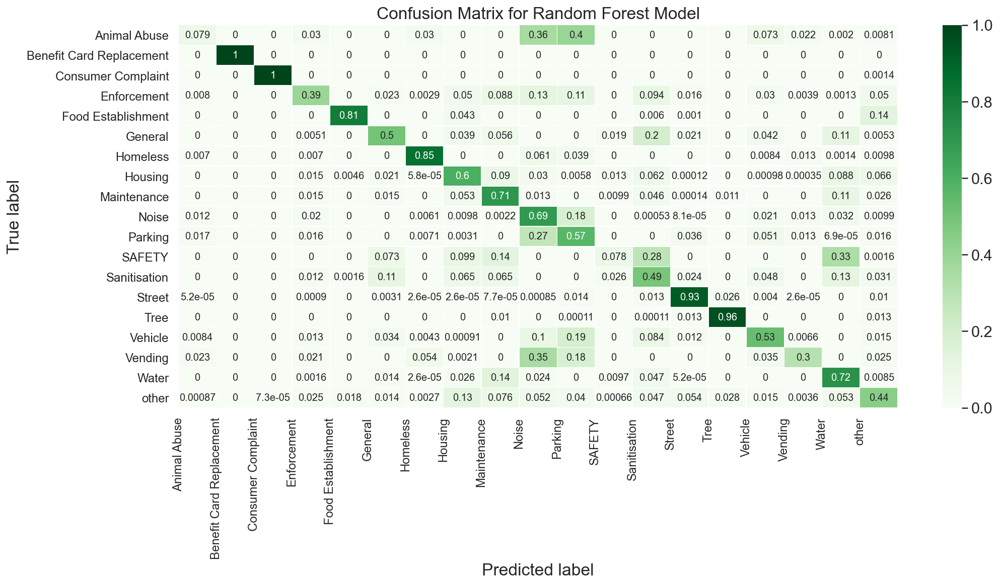

In [1047]:
# create Confusion Matrix
matrix = confusion_matrix(y_test,y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['Animal Abuse', 'Benefit Card Replacement', 'Consumer Complaint',
       'Enforcement', 'Food Establishment', 'General', 'Homeless',
       'Housing', 'Maintenance', 'Noise', 'Parking', 'SAFETY',
       'Sanitisation', 'Street', 'Tree', 'Vehicle', 'Vending', 'Water',
       'other']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=90, fontsize=12)
plt.yticks(tick_marks2, class_names, rotation=0, fontsize=12)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

__<u>Observations:</u>__
- Classifier struggled most with labelling Animal Abuse and Safety (labelled correctly on around 8% of the time). Both these classes had smaller amounts of data as compared to the rest
- Benefit Card Replacement and Consumer Complaint were labelled correctly 100% of the time. Benefit Card Replacement incidents all had the same values for all features in each row except the date opened. All the Consumer Complaint types had the value 'DCA' for Agency
- Tree and Street were the most accurately classified complaint types
- Animal Abuse was classified incorrectly as 'Noise' 36% of the time and 'Parking' 40% of the time
- Vending was classified more often as 'Noise' than 'Vending' itself
- Safety was classified more often as 'Water' than 'Safety' itself

In [1071]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.03      0.08      0.04       495
           1       1.00      1.00      1.00      1102
           2       1.00      1.00      1.00      2154
           3       0.33      0.39      0.36      3855
           4       0.70      0.81      0.75       994
           5       0.42      0.50      0.46      5250
           6       0.74      0.85      0.79      2136
           7       0.61      0.60      0.61     17334
           8       0.72      0.71      0.71     35713
           9       0.73      0.69      0.71     49138
          10       0.57      0.57      0.57     29156
          11       0.03      0.08      0.05       645
          12       0.44      0.49      0.46     12954
          13       0.94      0.93      0.93     38791
          14       0.82      0.96      0.89      8768
          15       0.54      0.53      0.54      8830
          16       0.11      0.30      0.16       482
          17       0.74    

__<u>Observations:</u>__
- Precision, recall, f1 score for Class 0 (Animal Abuse) and 11 (Safety) very low
- Overall, classes seem to have higher recall than precision which means the model is labelling more samples as the specific class so the recall ends up being higher but the classification isn't always correct so the precision is lower.


## Feature Importance

Determining which features were important in determining complaint types

In [1072]:
# create df of feature importances
imp_features =  pd.Series(model.feature_importances_, index = X_train.columns)

In [827]:
imp_features

Agency                    0.229044
IncidentZip               0.078757
AddressType               0.033768
FacilityType              0.028789
Status                    0.008119
Borough                   0.025517
Open Data Channel Type    0.057599
Park Borough              0.023987
Vehicle Type              0.000043
Taxi Company Borough      0.000120
Latitude                  0.089715
Longitude                 0.088712
CreatedYear               0.069930
DurationDays              0.048869
DayOpened                 0.050847
MonthOpened               0.069413
DaysTillDue               0.045780
DaysTillUpdate            0.050993
dtype: float64

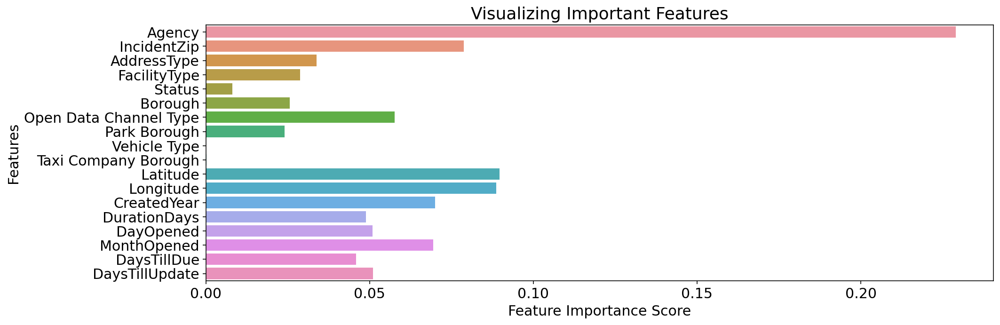

In [830]:
# plot feature importance
sns.barplot(x=imp_features, y=imp_features.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

__<u>Observation:</u>__
- Agency is the most important feature in determining complaint type which makes sense if specific agencies are assigned to handle specific complaint types (e.g. DCA for consumer complaints)
- Location related features are the next most important features suggesting that complaint types tend to vary by location

### Benefits:

Predicting the type of a complaint will be especially useful having determined that agency and location help determine the complaint type. This will allow NYC 311 to allocate appropriate resources/agencies to appropriate locations in order to handle complaints more efficiently. The abiltity to predict the complaint type will also be increase the speed at which action is taken.


# Further exploration and Visualizations

## Average Duration to Resolve Incident per Complaint Type

In [1086]:
# create df grouping by complaint types
complaint_dur = pd.DataFrame(subset.groupby('ComplaintType')['DurationDays'].mean())
complaint_dur = complaint_dur.reset_index()
complaint_dur = complaint_dur.sort_values('DurationDays')

Text(0, 0.5, 'Days till SR closed on Average')

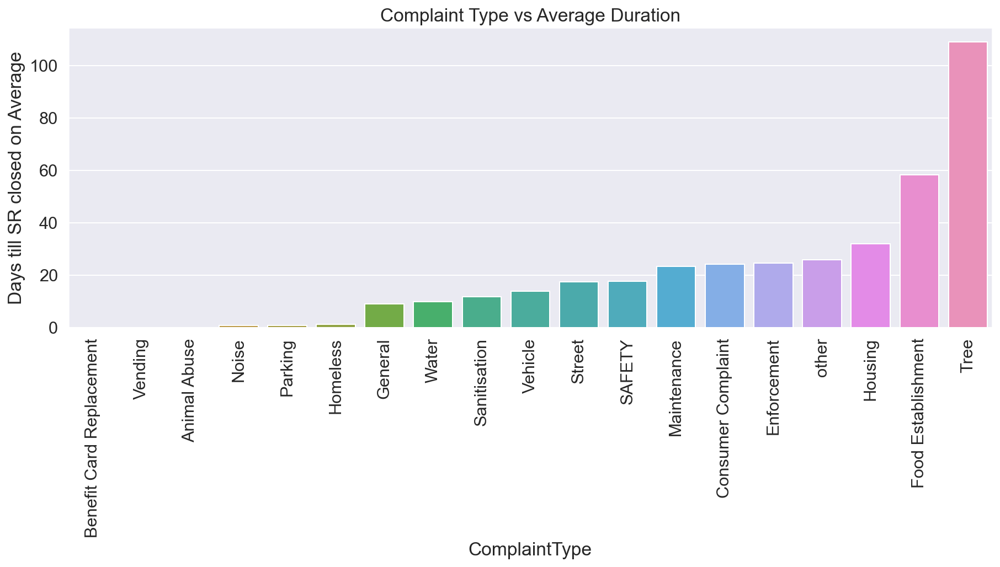

In [1087]:
# plot graph of above df
sns.barplot(x ='ComplaintType', y = 'DurationDays', data = complaint_dur)
plt.xticks(rotation=90)
plt.title('Complaint Type vs Average Duration')
plt.ylabel('Days till SR closed on Average')

__<u>Observations:</u>__
- Tree related complaints take the longest to close, almost double the avg duration of Food Establishment
- Benefit Card Replacement,Vending, Animal Abuse on average closes on the same day

## ANOVA 
To determine whether there is a significant difference between the mean duration between each complaint type

__Null Hypothesis__: There is no significant difference between mean days till closure per complaint type

__Alternate Hypothesis__: There is a significant difference between mean days till closure per complaint type

In [801]:
# ANOVA to determine whether there is a significant difference between the mean duration between each complaint type
mod = ols('DurationDays ~ ComplaintType', subset).fit()
anova = sm.stats.anova_lm(mod, typ = 2)
print(anova)

                     sum_sq        df            F  PR(>F)
ComplaintType  2.105162e+08      18.0  1948.681364     0.0
Residual       3.904123e+09  650506.0          NaN     NaN


__F statistic = 1948.681364 and our P value = 0.0 (<0.05). We reject the null hypothesis that there is no significant difference between mean days till closure per complaint type.__

## Complaint Types with Unresolved Incidents

In [802]:
# check which complaint has most NaN close dates (unresolved)
notClosed = withDates[withDates['ClosedDate'].isnull()]
complaint_NaN = notClosed.groupby('ComplaintType')['UniqueKey'].count().reset_index()
complaint_NaN

,ComplaintType,UniqueKey
0,Consumer Complaint,18
1,Enforcement,4
2,Food Establishment,1105
3,General,74
4,Homeless,98
5,Housing,930
6,Maintenance,1917
7,Noise,634
8,Parking,100
9,SAFETY,15


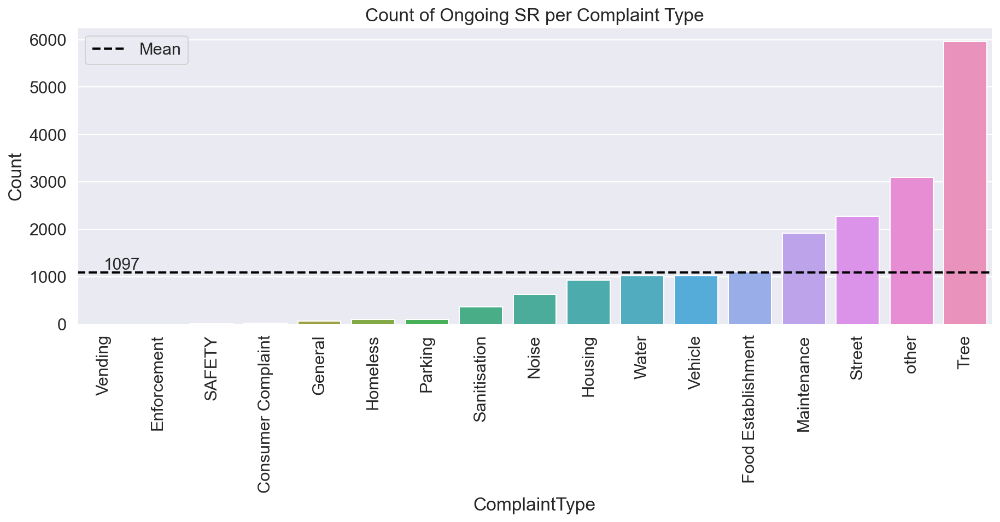

In [1097]:
# plot results
sns.barplot(x='ComplaintType', y='UniqueKey', data = complaint_NaN.sort_values('UniqueKey'))
plt.title('Count of Ongoing SR per Complaint Type')
plt.xticks(rotation=90)
plt.ylabel('Count')
plt.axhline(complaint_NaN['UniqueKey'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best')
plt.annotate(round(complaint_NaN['UniqueKey'].mean()),(0,1150),fontsize=15)
plt.show()

__<u>Observations:</u>__
- Tree related complaints have the most number of ongoing SR incidents
- No complaint type has 0 NaNs (all have >1 unresolved incident)
- On average, there are 1097 unresolved incidents per complaint type

## Average Duration to Resolve Incident per Borough

In [804]:
# group by borough to get average duration per borough
borough_dur= pd.DataFrame(subset.groupby('Borough')['DurationDays'].mean().reset_index())
borough_dur.sort_values('DurationDays')

,Borough,DurationDays
5,Unspecified,10.881703
0,BRONX,12.032289
2,MANHATTAN,14.621815
1,BROOKLYN,15.854232
4,STATEN ISLAND,16.566917
3,QUEENS,17.808294


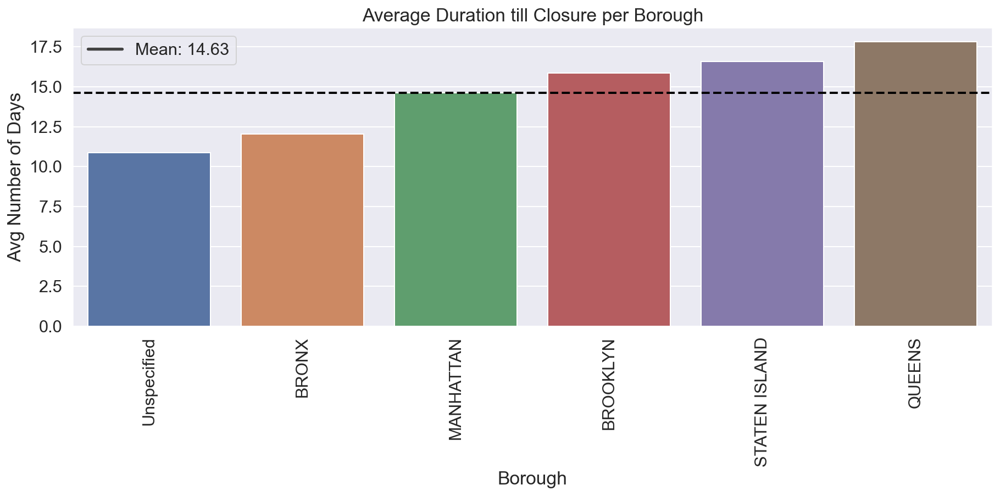

In [1105]:
# plot graph
sns.barplot(x='Borough', y='DurationDays', data = borough_dur.sort_values('DurationDays'))
plt.title('Average Duration till Closure per Borough')
plt.xticks(rotation=90)
plt.ylabel('Avg Number of Days')
plt.axhline(borough_dur['DurationDays'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best', labels=["Mean: " + str(round(borough_dur['DurationDays'].mean(),2))])
plt.show()

__<u>Observations:</u>__
- Complaints from Queens take the longest on average to close
- On average, complaints take 14.63 days to close

## Average Duration for Resolution per Complaint Type per Borough

In [901]:
# group by complaint type and borough
borough_comp = subset.groupby(['ComplaintType','Borough'])['DurationDays'].mean().unstack()

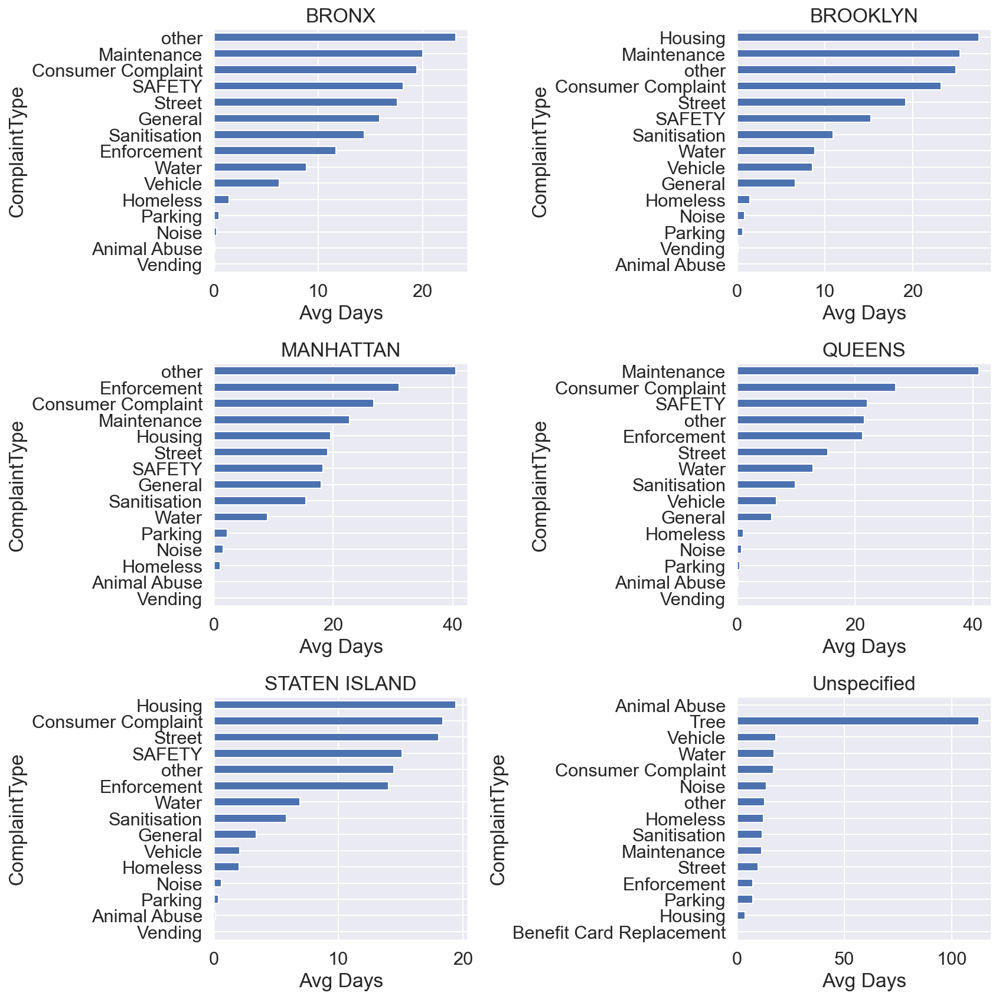

In [1107]:
# create subplots of each Borough
fig, axes = plt.subplots(3,2, figsize=(12,12))

for i, (label,col) in enumerate(borough_comp.iteritems()):
    ax = axes[int(i/2), i%2]
    col = col.sort_values(ascending=True)[:15]
    col.plot(kind='barh', ax=ax)
    ax.set_title(label)
    ax.set_xlabel('Avg Days')
    
plt.tight_layout()

__<u>Observations:</u>__
- 'Benefit Card Replacement' type only present in 'Unspecified' Borough
- 'Animal Abuse' and 'Vending' have the lowest duration to resolve incidents on average across all Boroughs
- 'Tree' complaints all come from 'Unspecified' Boroughs
- 'Consumer Complaint' types are one of the top 4 complaint types that take the longest to resolve amongst all the specified boroughs
- 'Maintenance' is also one of the top 4 in all specified boroughs except for 'Staten Island'
- Queens and Manhattan have a larger range of durations as compared to the other specified boroughs

## ANOVA
Check whether days taken to resolve incidents significantly differ by Borough

__Null Hypothesis__: There is no significant difference between mean days till resolution per Borough

__Alternate Hypothesis__: There is a significant difference between mean days till resolution per Borough

In [1082]:
# ANOVA to determine whether there is a significant difference between the mean duration between each Borough
mod = ols('DurationDays ~ Borough', subset).fit()
anova = sm.stats.anova_lm(mod, typ = 2)
print(anova)

                sum_sq        df          F        PR(>F)
Borough   2.936175e+06       5.0  92.907375  3.897509e-98
Residual  4.111703e+09  650519.0        NaN           NaN


__F statistic = 92.907375 and our P value = 3.898 x 10^(-98). We reject the null hypothesis that there is no significant difference between average duration till resolution per Borough__

## Average Duration to Resolve Incidents per Year

In [1109]:
# create df for duration over years
year = pd.DataFrame(subset.groupby('CreatedYear')['DurationDays'].mean().reset_index())

# create df of count of incidents over time
year_count = pd.DataFrame(subset.groupby('CreatedYear')['UniqueKey'].count().reset_index())

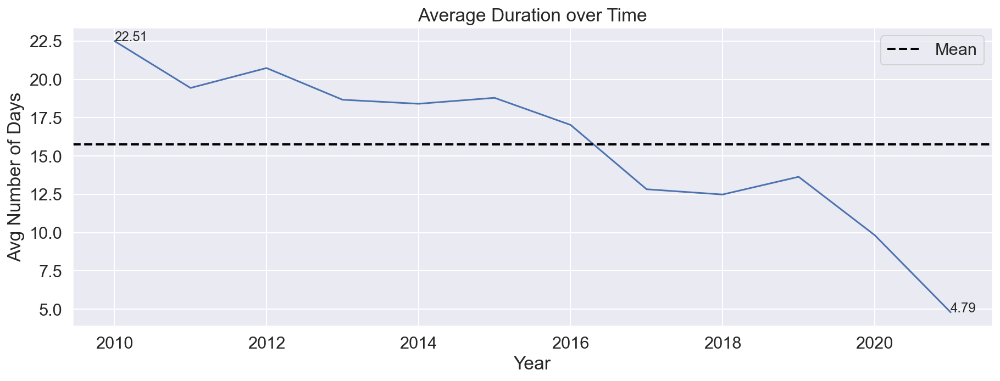

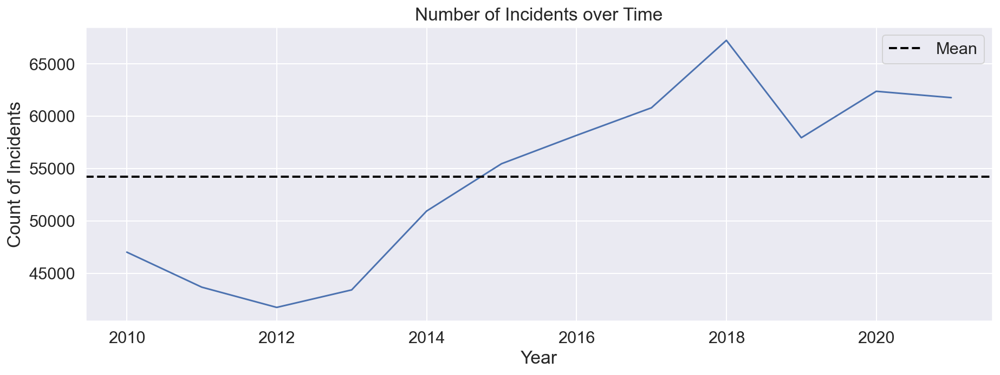

In [1119]:
# plot results
sns.lineplot(x='CreatedYear',y='DurationDays',data=year,markers=True)
plt.title('Average Duration over Time')
plt.xlabel('Year')
plt.ylabel('Avg Number of Days')
plt.axhline(year['DurationDays'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best')
plt.annotate(round(22.508966,2),(2010,22.508966),fontsize=12)
plt.annotate(round(4.789611,2),(2021,4.789611),fontsize=12)
plt.show()

sns.lineplot(x='CreatedYear',y='UniqueKey',data=year_count,markers=True)
plt.title('Number of Incidents over Time')
plt.xlabel('Year')
plt.ylabel('Count of Incidents')
plt.axhline(year_count['UniqueKey'].mean(), color='black', linestyle='--', linewidth=2, label='Mean')
plt.legend(loc='best')
plt.show()

__<u>Observations:</u>__
- Average days taken to resolve SR decreased over time while number of incidents increase over time. 
- This could indicate improvements in efficiency, allocation of resources, agencies, etc to resolve incidents over time
- There is a drop in 2019 in the number of incidents reported but a slight peak in average duration for resolution

## Correlation

Finding the correlation between CreatedYear and DurationDays

In [809]:
print("Pearson Correlation Coefficient: ", year['CreatedYear'].corr(year['DurationDays'],method='pearson'))

Pearson Correlation Coefficient:  -0.9350940859754913


There is a strong, negative correlation between the year that the incident was reported and the length of time in days it takes on average to close the incident

In [1081]:
#subset.to_csv('subset.csv')

## Visualize Change in Duration of Resolution per City from 2010-2021

In [11]:
byCity = subset.groupby(['CreatedYear','City'])[['DurationDays','Latitude','Longitude']].mean().reset_index()

In [13]:
# plot dynamic visualization
fig = px.scatter_geo(byCity.sort_values('CreatedYear'), lat= byCity['Latitude'], lon=byCity['Longitude'],
                     hover_name=None, hover_data=['City'], size="DurationDays", color='DurationDays',
                     animation_frame="CreatedYear",
                     center={"lat": 40.6885, "lon": -73.88049},
                     width=900, height=700,locationmode = 'ISO-3')

fig.update_layout(title_text="Change in Duration to Close Incident by City from 2010-2021",   
                      mapbox_zoom=20, mapbox_style="carto-positron", geo = dict( scope='usa',
                          lonaxis_range= [ -73.97122, -73.700747 ],
        lataxis_range= [ 40.556546,40.864981 ],showsubunits=True), mapbox_center = {
                      "lat": 40.6885, "lon": -73.93211},)        
fig.layout.coloraxis.showscale = False    
                      

font=dict(family="silom",
              size=14, color="#58508d")

fig.update_layout(transition = {'duration': 10})

fig.show()

__Click 'play' or move the slider to visualize the change throughout the years. Hover over the points on the map for information on the Duration, Latitude and Longitude, City name__

__<u>Observations:</u>__
- Visually obvious reduction in number of days taken to resolve incidents throughout all cities
- 2018 onwards the durations are a lot lower overall

## Change in Number of Incidents over the Year 2021

In [16]:
# df of year 2021
year_2021 = subset[subset['CreatedYear'] == 2021]
year_2021 = year_2021.sort_values('MonthOpened')

In [17]:
fig = px.density_mapbox(year_2021, lat=year_2021['Latitude'], 
                            lon=year_2021['Longitude'], 
                            radius=2,
                            animation_frame=year_2021['MonthOpened'],
                            hover_name=None, 
                            hover_data=['ComplaintType', 
                            'City'],
                            width=900, height=700,
    color_continuous_scale=px.colors.sequential.Viridis)

fig.update_layout(title_text="Change in Number of Incidents over the Year 2021",
                  mapbox_style="carto-positron",   
                      mapbox_zoom=9.2, mapbox_center = {
                      "lat": 40.6885, "lon": -73.93211},)        
fig.layout.coloraxis.showscale = False    
                      

font=dict(family="silom",
              size=14, color="#58508d")

fig.update_layout(transition = {'duration': 10})

fig.show()

__Click 'play' or move the slider to visualize the change throughout the months of 2021. Hover over the points on the map for information on the Complaint Type, Latitude and Longitude, City name__

__<u>Observations:</u>__:
- Incident reports more concentrated on western side of NYC
- Number of incidents reported are much lower in December - probably because December 2021 still ongoing
- Number of incidents peak around mid year and september

## Change in Duration to Resolve Incidents Over Time (looking at each incident individually)

In [20]:
# taking a smaller sample for visualization
smaller=subset.sample(frac=0.5)

In [19]:
# plot results (saved to html file due to size)
fig = px.scatter_geo(smaller.sort_values('CreatedYear'), lat= smaller['Latitude'], lon=smaller['Longitude'],
                     hover_name=None, hover_data=['City'], size="DurationDays",
                     animation_frame="CreatedYear", color='DurationDays',
                     center={"lat": 40.6885, "lon": -73.93211},
                     width=900, height=700,color_continuous_scale=px.colors.sequential.Viridis)

fig.update_layout(title_text="Duration to Close Incident by Location from 2010-present",   
                      mapbox_zoom=15, mapbox_style="carto-positron", geo = dict(
                          lonaxis_range= [ -74.254788, -73.700384 ],
        lataxis_range= [ 40.498897,40.912869 ]), mapbox_center = {
                      "lat": 40.6885, "lon": -73.93211},)        
fig.layout.coloraxis.showscale = False    
                      

font=dict(family="silom",
              size=14, color="#58508d")

fig.update_layout(transition = {'duration': 10})

#fig.show()

In [18]:
# load saved html file of figure
iframe = '<iframe width="900" height="700" frameborder="0" scrolling="no" src="BubbleMap.html"></iframe>'
IPython.display.HTML(iframe)

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/display.py:717: UserWarning:

Consider using IPython.display.IFrame instead



__Click 'play' or move the slider to visualize the change throughout the years. Hover over the points on the map for information on the Duration, Latitude and Longitude, City name__

__<u>Observations:</u>__
- Duration to resolve incidents decreased over time as observed previously

## Limitations and Improvements

- Model accuracy could be improved through further hyperparameter tuning and using larger subset of the data. A comparison of different classifier models could be done to find the one best suited for the data.
- Bias in the way complaint types are grouped which could affect results
- Oversampling alone may not be effective to handle imbalanced classes (as seen by results of classifier on classes with fewer samples). Instead, could implement a combination of over and undersampling
- For future scope: Could implement a regression model to predict the time taken to resolve a complaint. Could also try to incorporate demographic data if available. 